In [1]:
import pandas as pd
import numpy as np
from scipy.stats import zscore
import os

# Load your dataset
df = pd.read_csv(r'C:\Users\hp\Pictures\10 Academy\solar-challenge-week1\solar-challenge-week1\data\data\sierraleone-bumbuna.csv')


# 1. 📊 Summary Statistics
print("📊 Summary Statistics:")
print(df.describe())

# 2. 🧩 Missing Value Report
print("\n🧩 Missing Value Count:")
missing_values = df.isna().sum()
print(missing_values)

# 3. ⚠️ Columns with >5% Missing Values
print("\n⚠️ Columns with >5% Missing Values:")
total_rows = len(df)
threshold = total_rows * 0.05
high_null_cols = missing_values[missing_values > threshold]
print(high_null_cols)


📊 Summary Statistics:
                 GHI            DNI            DHI           ModA  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      201.957515     116.376337     113.720571     206.643095   
std       298.495150     218.652659     158.946032     300.896893   
min       -19.500000      -7.800000     -17.900000       0.000000   
25%        -2.800000      -0.300000      -3.800000       0.000000   
50%         0.300000      -0.100000      -0.100000       3.600000   
75%       362.400000     107.000000     224.700000     359.500000   
max      1499.000000     946.000000     892.000000    1507.000000   

                ModB           Tamb             RH             WS  \
count  525600.000000  525600.000000  525600.000000  525600.000000   
mean      198.114691      26.319394      79.448857       1.146113   
std       288.889073       4.398605      20.520775       1.239248   
min         0.000000      12.300000       9.900000       0.000000   
25%        

In [2]:

# 4.  Outlier Detection & Cleaning
key_columns = ['GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'WS', 'WSgust']
existing_cols = [col for col in key_columns if col in df.columns]

# Compute Z-scores and identify outliers
z_scores = df[existing_cols].apply(zscore)
outliers = (np.abs(z_scores) > 3)

print("\n🚨 Outlier Count in Each Column:")
print(outliers.sum())

# Replace outliers with NaN
df_clean = df.copy()
df_clean.loc[outliers.any(axis=1), existing_cols] = np.nan

# Impute missing values in key columns with median
df_clean[existing_cols] = df_clean[existing_cols].fillna(df_clean[existing_cols].median())

# 5. 💾 Export Cleaned Data
# Cleaned file will be saved to: data/benin_clean.csv (relative to working dir)
output_dir = "data"
output_path = os.path.join(output_dir, "benin_clean.csv")

os.makedirs(output_dir, exist_ok=True)
df_clean.to_csv(output_path, index=False)

print(f"\n Cleaned dataset saved to: {output_path}")



🚨 Outlier Count in Each Column:
GHI       2477
DNI       7586
DHI       2986
ModA      1604
ModB      2041
WS        3967
WSgust    3665
dtype: int64

 Cleaned dataset saved to: data\benin_clean.csv


C:\Users\hp\AppData\Local\Temp\ipykernel_34628\1307278726.py:13: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
c:\Users\hp\Pictures\10 Academy\solar-challenge-week1\solar-challenge-week1\venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


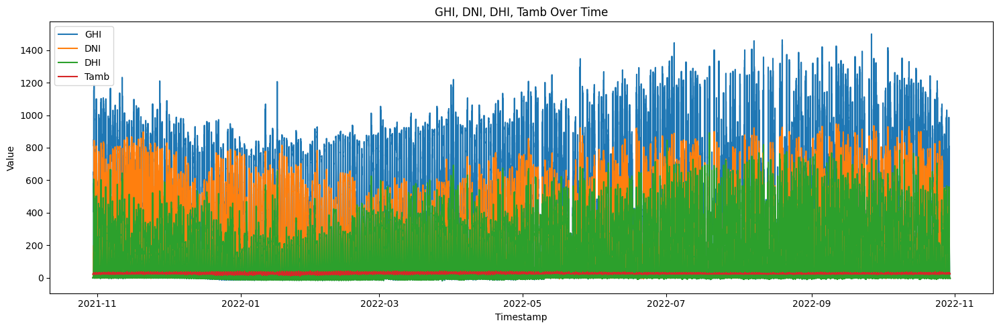

In [3]:
import matplotlib.pyplot as plt

df['Timestamp'] = pd.to_datetime(df['Timestamp'])
plt.figure(figsize=(15, 5))
plt.plot(df['Timestamp'], df['GHI'], label='GHI')
plt.plot(df['Timestamp'], df['DNI'], label='DNI')
plt.plot(df['Timestamp'], df['DHI'], label='DHI')
plt.plot(df['Timestamp'], df['Tamb'], label='Tamb')
plt.title('GHI, DNI, DHI, Tamb Over Time')
plt.xlabel('Timestamp')
plt.ylabel('Value')
plt.legend()
plt.tight_layout()
plt.show()


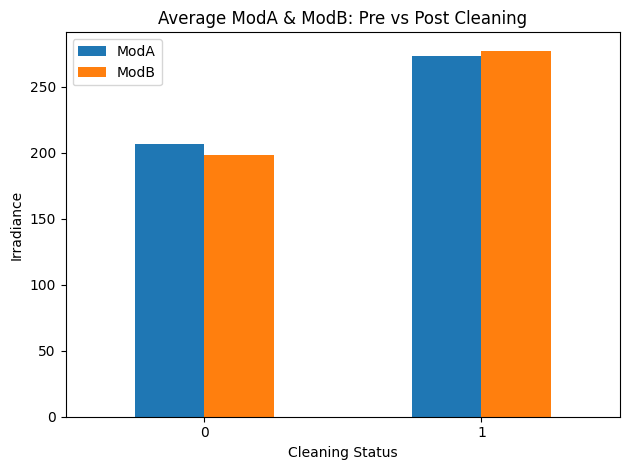

In [4]:
if 'Cleaning' in df.columns:
    df['Cleaning'] = df['Cleaning'].astype(str)
    df.groupby('Cleaning')[['ModA', 'ModB']].mean().plot(kind='bar')
    plt.title("Average ModA & ModB: Pre vs Post Cleaning")
    plt.ylabel("Irradiance")
    plt.xlabel("Cleaning Status")
    plt.xticks(rotation=0)
    plt.tight_layout()
    plt.show()


c:\Users\hp\Pictures\10 Academy\solar-challenge-week1\solar-challenge-week1\venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


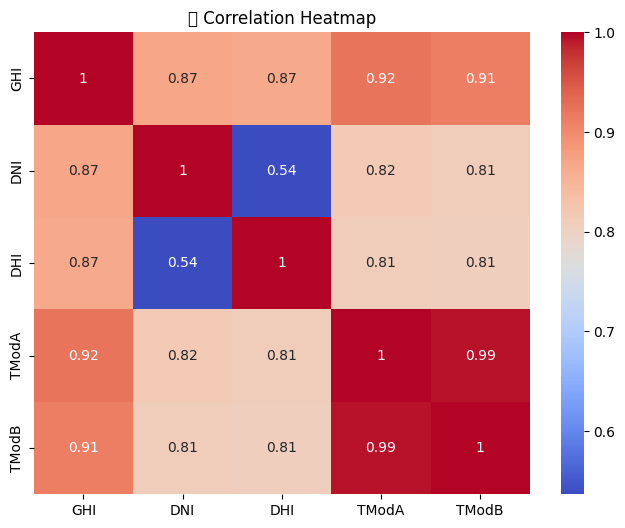

In [5]:
import seaborn as sns
import matplotlib.pyplot as plt

corr_cols = ['GHI', 'DNI', 'DHI', 'TModA', 'TModB']
plt.figure(figsize=(8, 6))
sns.heatmap(df[corr_cols].corr(), annot=True, cmap="coolwarm")
plt.title("📈 Correlation Heatmap")
plt.show()


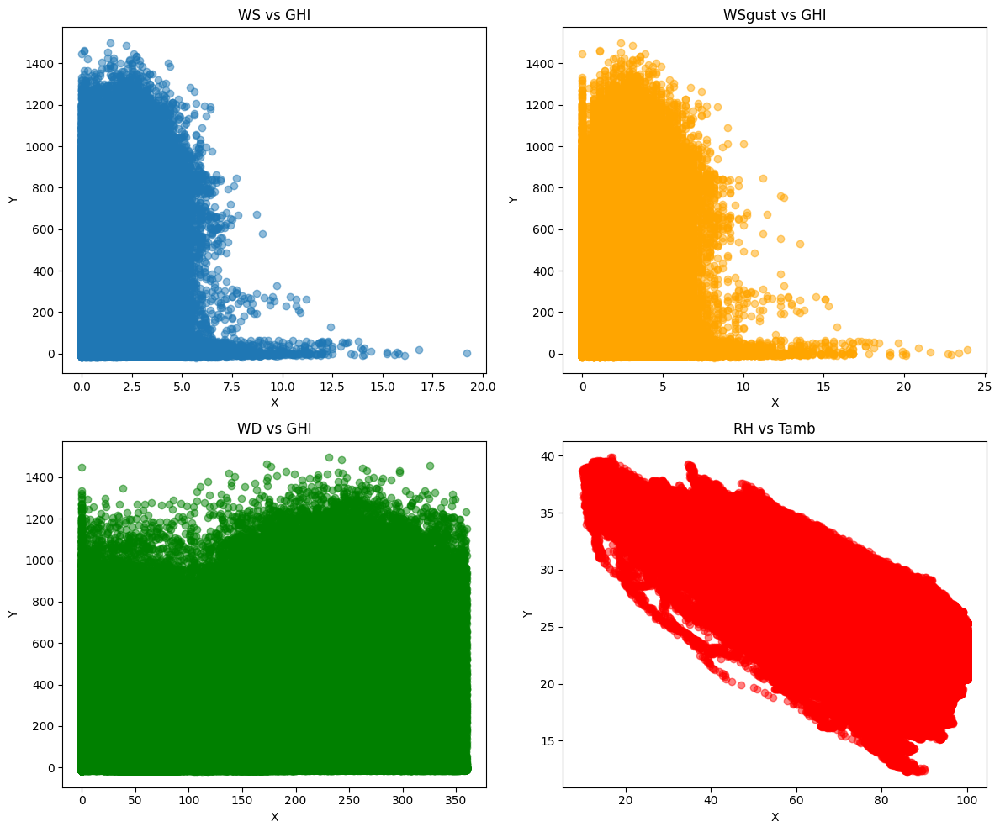

In [6]:
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

axs[0, 0].scatter(df['WS'], df['GHI'], alpha=0.5)
axs[0, 0].set_title('WS vs GHI')

axs[0, 1].scatter(df['WSgust'], df['GHI'], alpha=0.5, color='orange')
axs[0, 1].set_title('WSgust vs GHI')

axs[1, 0].scatter(df['WD'], df['GHI'], alpha=0.5, color='green')
axs[1, 0].set_title('WD vs GHI')

axs[1, 1].scatter(df['RH'], df['Tamb'], alpha=0.5, color='red')
axs[1, 1].set_title('RH vs Tamb')

for ax in axs.flat:
    ax.set_xlabel("X")
    ax.set_ylabel("Y")

plt.tight_layout()
plt.show()


In [7]:
import plotly.express as px

fig = px.bar_polar(df, r='WS', theta='WD', color='WS',
                   color_continuous_scale='Viridis',
                   title="Wind Rose: WS by Wind Direction")
fig.show()


In [ ]:

# Scatterplot to observe relationship between temperature and RH
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='RH', y='Tamb', alpha=0.6)
plt.title("Temperature vs. Relative Humidity")
plt.xlabel("Relative Humidity (%)")
plt.ylabel("Ambient Temperature (°C)")
plt.grid(True)
plt.show()


In [1]:
# Bubble chart: GHI vs. Tamb, bubble size = RH or BP
plt.figure(figsize=(10, 7))
bubble_size = df['RH']  # You can switch to 'BP' for pressure

plt.scatter(df['Tamb'], df['GHI'], s=bubble_size, alpha=0.5, c=bubble_size, cmap='viridis')
plt.colorbar(label='Relative Humidity (%)')
plt.title("Bubble Chart: GHI vs. Tamb with RH as Bubble Size")
plt.xlabel("Ambient Temperature (°C)")
plt.ylabel("Global Horizontal Irradiance (W/m²)")
plt.grid(True)
plt.show()


NameError: name 'plt' is not defined